In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import cv2
import glob
import os
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
from keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import random
import math
import tensorflow as tf


Using TensorFlow backend.


In [0]:
train_data_dir = 'drive/My Drive/test/fruit_dataset/Train/'
test_data_dir = 'drive/My Drive/test/fruit_dataset/Test/'

In [0]:
# this function used to read and image with specified color mode and normalize each pixel to 0-1 range
def read_and_preprocess_img(image_path,img_color,img_size):
    image = cv2.imread(image_path,cv2.IMREAD_COLOR)
    if(img_color == "RGB"):
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    elif(img_color == "Gray"):
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    imResize = cv2.resize(image, dsize=img_size) 
    return imResize.astype("float32")/255


In [0]:
def read_data(path,img_color,img_size):
    data_fruit_img = []
    data_label = []
    for dir_path in glob.glob(path+"/*"):
        img_label = dir_path.split("/")[-1]
        for image_path in glob.glob(os.path.join(dir_path,"*.jpg")):
            image = read_and_preprocess_img(image_path,img_color,img_size)
            data_fruit_img.append(image)
            data_label.append(img_label)
    return (np.array(data_fruit_img),np.array(data_label))

In [0]:
# Read Training data
X_train,train_label = read_data(train_data_dir,"RGB",(100,100))
print(X_train.shape)
print(train_label.shape)

(4876, 100, 100, 3)
(4876,)


In [0]:
# Read Testing data
X_test,test_label = read_data(test_data_dir,"RGB",(100,100))
print(X_test.shape)
print(test_label.shape)

(1636, 100, 100, 3)
(1636,)


(100, 100, 3)


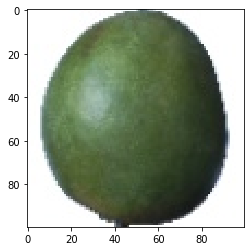

In [0]:
print(X_train[100].shape)
plt.imshow(X_train[100])
plt.show()


In [0]:
# Visualized Array of Images in a grid like plot, given its #of colomns and rows and Figure sizes.
def plot_image_grid(images, nb_rows, nb_cols, figsize=(20, 20)):
    assert len(images) == nb_rows*nb_cols, "Number of images should be the same as (nb_rows*nb_cols)"
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=figsize)
    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].axis('off')
            axs[i, j].imshow(images[n])
            n += 1

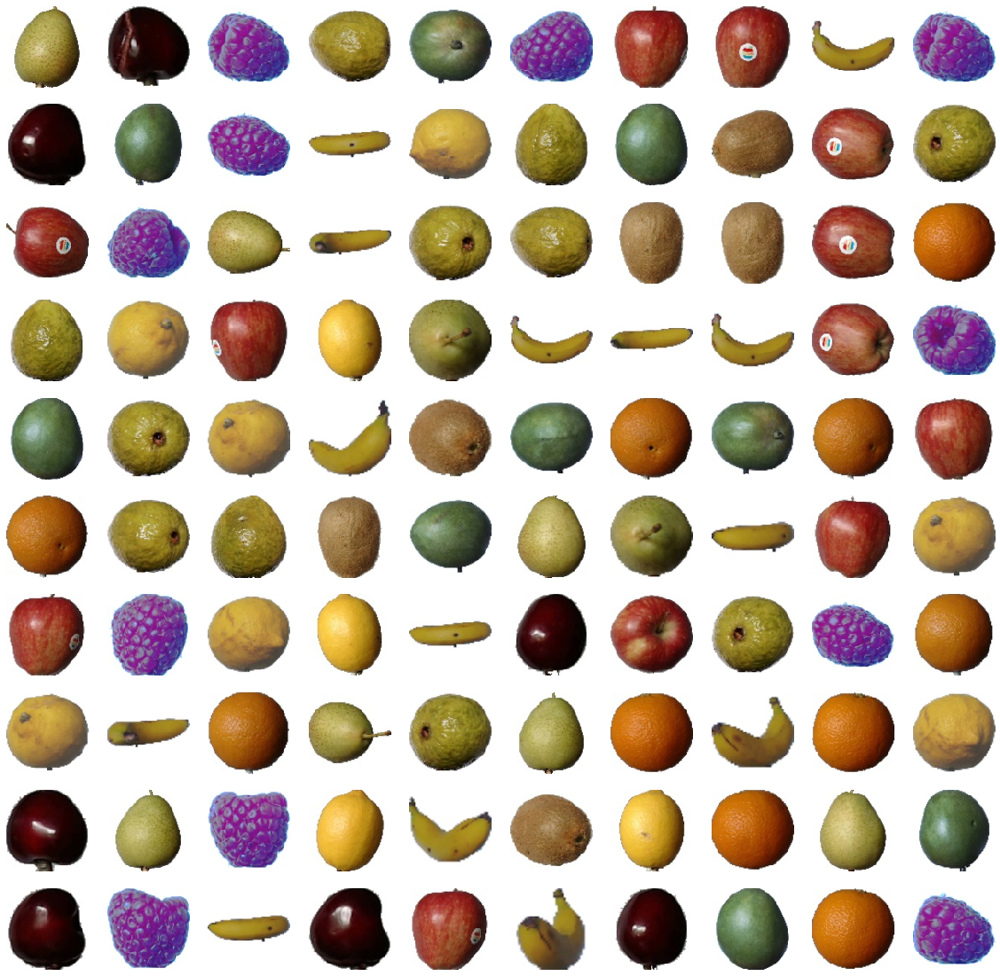

In [0]:
random_sample = random.sample(list(X_train),  100)
plot_image_grid(random_sample, 10, 10)


In [0]:
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    validation_split = .25
)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size = (100,100),
    #batch_size=batch_size_train,
    class_mode='categorical',
    subset='training'
)
validation_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size = (100,100),
    #batch_size=batch_size_valid,#default is 32
    class_mode='categorical',
    subset='validation'
)
test_generator = test_datagen.flow_from_directory(
    directory=test_data_dir,
    target_size=(100, 100),
    batch_size=1,
    shuffle = False,
)

Found 3661 images belonging to 10 classes.
Found 1215 images belonging to 10 classes.
Found 1636 images belonging to 10 classes.


In [0]:
training_data = pd.DataFrame(train_generator.classes, columns=['classes'])

In [0]:
testing_data = pd.DataFrame(test_generator.classes, columns=['classes'])

In [0]:
def create_stack_bar_data(col, df):
    aggregated = df[col].value_counts().sort_index()
    x_values = aggregated.index.tolist()
    y_values = aggregated.values.tolist()
    return x_values, y_values

In [0]:
x1, y1 = create_stack_bar_data('classes', training_data)
x1 = list(train_generator.class_indices.keys())

In [0]:
x2, y2 = create_stack_bar_data('classes', testing_data)
x2 = list(test_generator.class_indices.keys())

In [0]:
x1

['Apple',
 'Banana',
 'Cherry',
 'Guava',
 'Kiwi',
 'Lemon',
 'Mango',
 'Orange',
 'Pear',
 'Raspberry']

In [0]:
# return index of the class along with number of images in that class
def create_stack_bar_data(col, df):
    aggregated = df[col].value_counts().sort_index()
    x_values = aggregated.index.tolist()
    y_values = aggregated.values.tolist()
    return x_values, y_values

In [0]:
x1, y1 = create_stack_bar_data('classes', training_data)
# get corresponding classes label using it's indices
x1 = list(train_generator.class_indices.keys())

In [0]:
x2, y2 = create_stack_bar_data('classes', testing_data)
x2 = list(test_generator.class_indices.keys())

<BarContainer object of 10 artists>

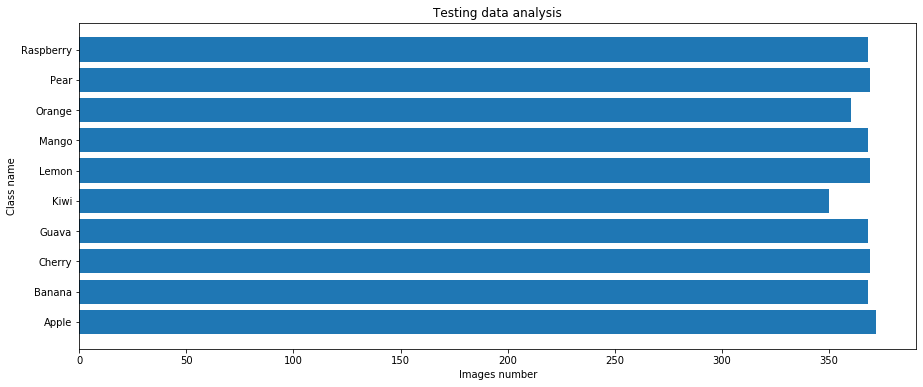

In [0]:
#  plotting the results
fig, ax = plt.subplots(figsize=(15, 6))
ax.set( xlabel='Images number', ylabel='Class name',
       title='Testing data analysis')
ax.barh(x1, y1)

<BarContainer object of 10 artists>

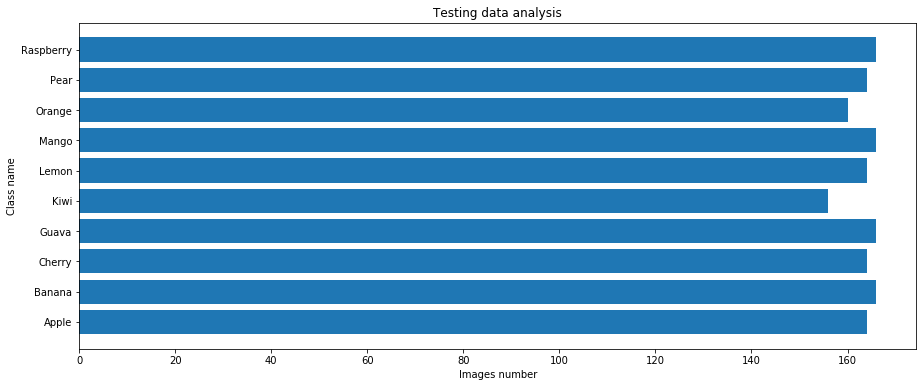

In [0]:
fig2, ax2 = plt.subplots(figsize=(15, 6))
ax2.set( xlabel='Images number', ylabel='Class name',
       title='Testing data analysis')
ax2.barh(x2, y2)

In [0]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

model = Sequential()

model.add(Conv2D(filters=16, kernel_size=2, padding='same', activation='relu', input_shape=(100, 100, 3)))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(GlobalAveragePooling2D())
model.add(Dense(500, activation='relu'))
model.add(Dense(10, activation='softmax'))       
model.summary()






Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 100, 100, 16)      208       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 50, 50, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 50, 50, 32)        2080      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 25, 25, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 25, 25, 64)        8256      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
global_average_pooling2d_1 ( (None, 64)           

In [0]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:
from keras.callbacks import ModelCheckpoint,EarlyStopping  

#Early stopping
early_stopping = EarlyStopping(monitor='val_acc', verbose=1, patience=4)

### TODO: specify the number of epochs that you would like to use to train the model.

epochs = 50

checkpointer = ModelCheckpoint(filepath='drive/My Drive/test/saved_models/weights.best.basic_cnn.hdf5', 
                               verbose=1, save_best_only=True)
with tf.device("/device:GPU:0"):
    history = model.fit_generator(
            train_generator,
            steps_per_epoch=train_generator.samples // train_generator.batch_size,
            epochs=epochs,
            callbacks=[checkpointer,early_stopping],
            verbose=1,
            validation_data=validation_generator,
            validation_steps=validation_generator.samples // validation_generator.batch_size)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Epoch 1/50





114/114 [==============================] - 32s 283ms/step - loss: 1.3196 - acc: 0.5513 - val_loss: 0.5023 - val_acc: 0.7272

Epoch 00001: val_loss improved from inf to 0.50225, saving model to drive/My Drive/test/saved_models/weights.best.basic_cnn.hdf5
Epoch 2/50
114/114 [==============================] - 30s 267ms/step - loss: 0.4880 - acc: 0.8232 - val_loss: 0.3003 - val_acc: 0.8402

Epoch 00002: val_loss improved from 0.50225 to 0.30026, saving model to drive/My Drive/test/saved_models/weights.best.basic_cnn.hdf5
Epoch 3/50
114/114 [==============================] - 31s 273ms/step - loss: 0.4136 - acc: 0.8472 - val_loss: 0.4260 - val_acc: 0.8462

Epoch 00003: val_loss did not improve from 0.30026
Epoch 4/50
114/114 [==============================] - 31s 272ms/step - loss: 0.3582 - acc: 0.8679 - val_loss: 0.3202 - val_acc: 0.8419

Epoch 00004: val_loss did not improve fro

In [0]:
model.load_weights("drive/My Drive/test/saved_models/weights.best.basic_cnn.hdf5")

In [0]:
model.evaluate_generator(test_generator, test_generator.samples)

[0.18913657147192137, 0.9529339853300733]

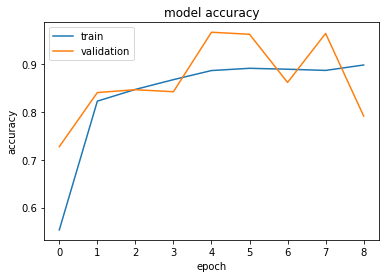

In [0]:
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

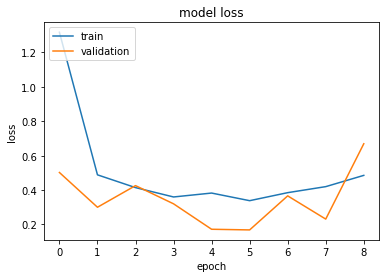

In [0]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [0]:
# given fruit class name, get a sample image from it's directory
def get_specific_class_img (class_name):
    root_directory = 'drive/My Drive/test/fruit_dataset/Train/'+ class_name + '/'
    img_path = glob.glob(os.path.join(root_directory,"*.jpg"))[0]
    return read_and_preprocess_img(img_path,"RGB",(100,100))


In [0]:
# given an image get it's predicted class label
def model_predict(img):
    # obtain predicted vector
    predicted_vector = model.predict(img)
    # return fruit class that is predicted by the model
    return x1[np.argmax(predicted_vector)]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


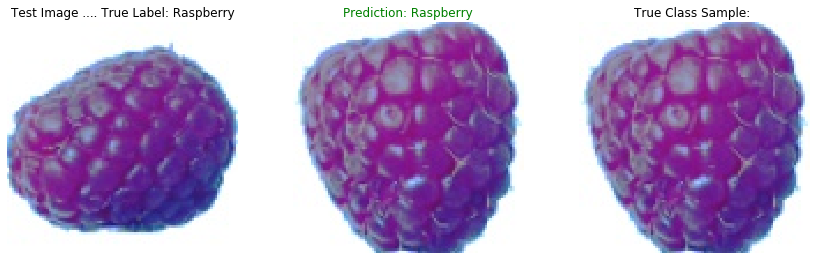

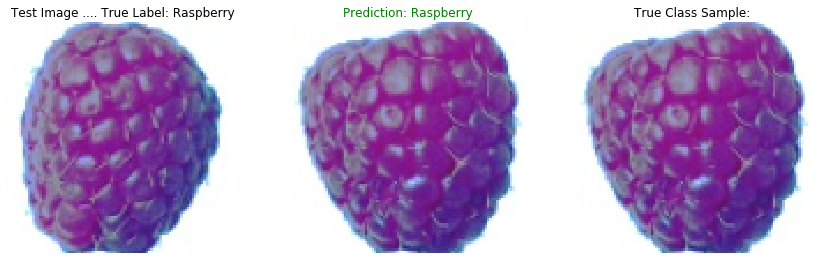

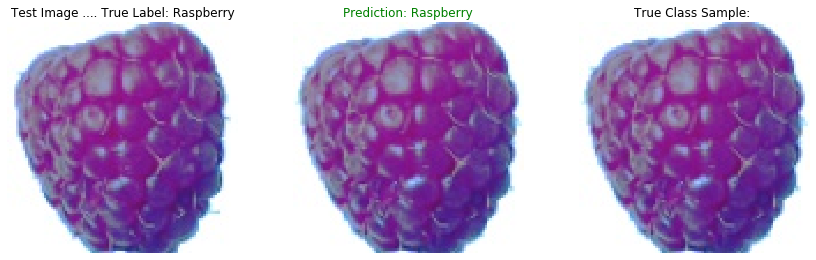

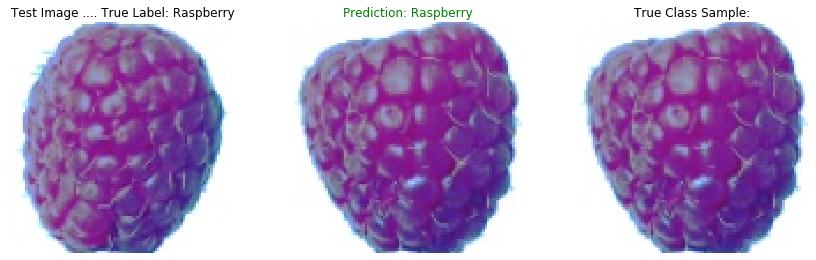

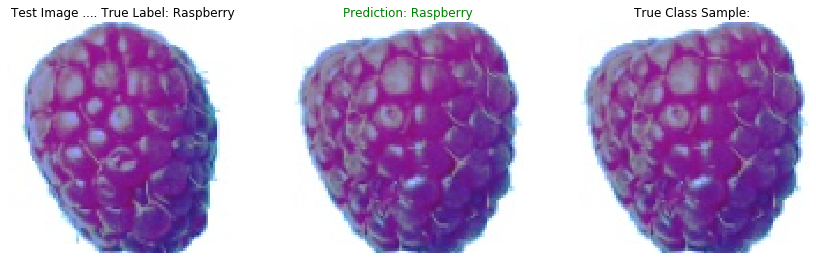

...

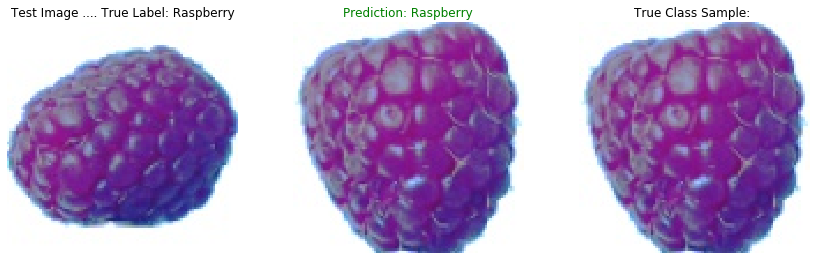

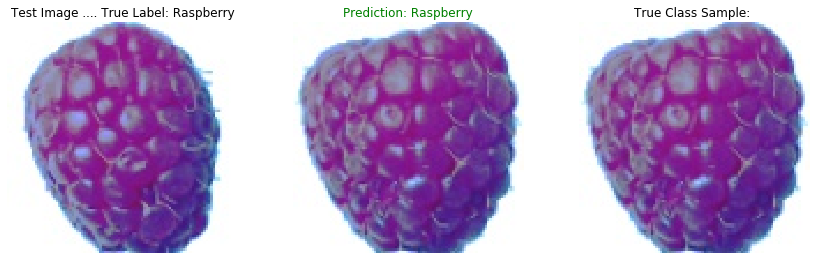

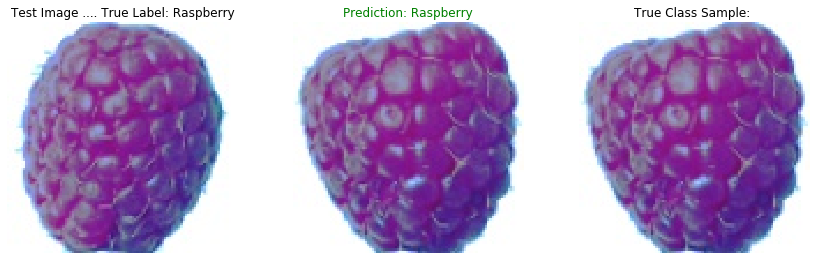

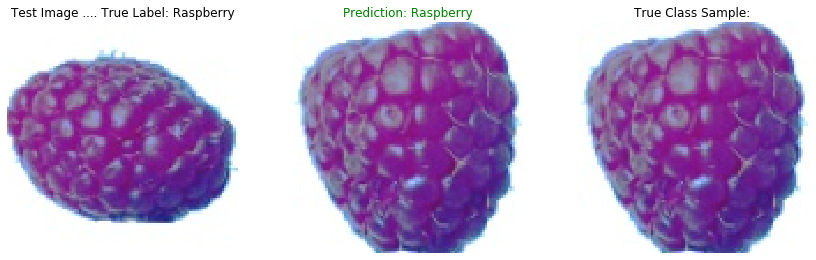

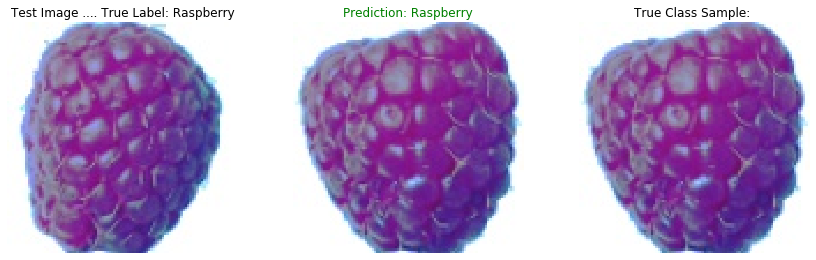

In [0]:
import os
#TestData_dir = 'drive/My Drive/test/TestData/'
right_pred = 0
X_real_test,test_label = read_data(test_data_dir,"RGB",(100,100))
for i,img in enumerate(X_real_test):
    pred_class_name = model_predict(np.expand_dims(img, axis=0))
    true_label = test_label[i]
    pred_right = (true_label == pred_class_name)
    if pred_right:
        right_pred += 1
    f, (ax1,ax2,ax3) = plt.subplots(1,3)
    plt.subplots_adjust(bottom=0.1, right=2, top=0.9)
    ax1.imshow(img)
    ax1.set_axis_off()    
    ax1.set_title('Test Image .... True Label: '+ true_label)
    ax2.imshow(get_specific_class_img(pred_class_name))
    ax2.set_axis_off()
    ax2.set_title('Prediction: '+ pred_class_name,color=("green" if pred_right else "red"))
    ax3.imshow(get_specific_class_img(true_label))
    ax3.set_axis_off()
    ax3.set_title('True Class Sample: ')

In [0]:
print("Basic Model predicted {} images right,accuracy = {}%".format(right_pred,(right_pred*100./1636)))

Basic Model predicted 1567 images right,accuracy = 95.78239608801955%


In [0]:
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    rotation_range=90,
    width_shift_range=.02,
    height_shift_range=.02,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='constant',
    cval=1.,
    brightness_range=[0.5, 1.5],
    shear_range=0.8,
    validation_split = .25
)

test_datagen = ImageDataGenerator(rescale=1. / 255)
batch_size_train = 128
batch_size_valid = 128

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size = (100,100),
    #batch_size=batch_size_train,
    class_mode='categorical',
    subset='training'
)
validation_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size = (100,100),
    #batch_size=batch_size_valid,#default is 32
    class_mode='categorical',
    subset='validation'
)
test_generator = test_datagen.flow_from_directory(
    directory=test_data_dir,
    target_size=(100, 100),
    batch_size=1,
    shuffle = False,
)

Found 3661 images belonging to 10 classes.
Found 1215 images belonging to 10 classes.
Found 1636 images belonging to 10 classes.


In [0]:
import matplotlib.pyplot as plt
# take subset of training data
random_train_sample = np.array(random.sample(list(X_train),  10))

In [0]:
i = 0
for x_batch in train_datagen.flow(random_train_sample, batch_size=1,save_to_dir='drive/My Drive/test/AugmentedData/', save_prefix='aug', save_format='jpeg'):
    i += 1
    if i >= 30:
        break

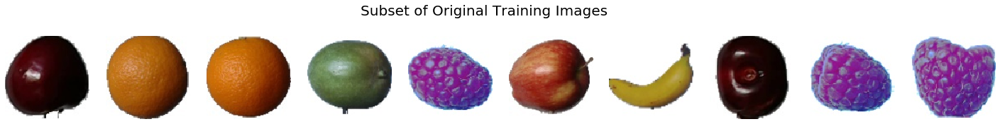

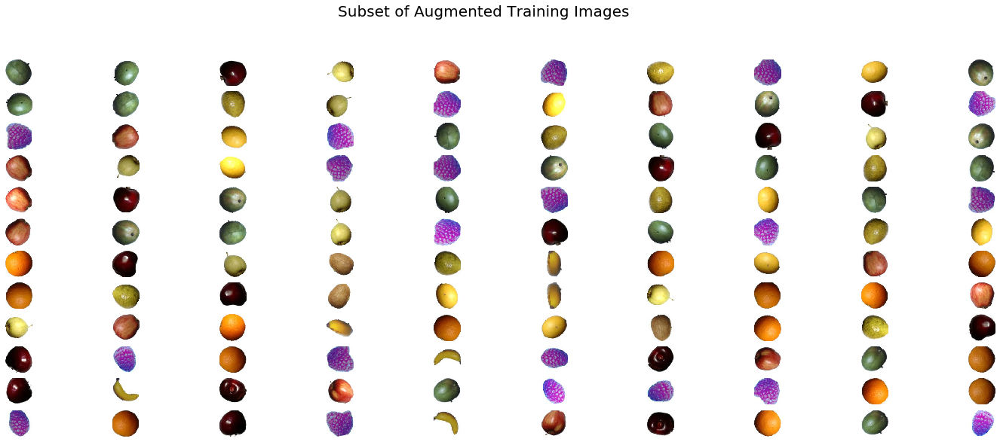

In [0]:
import matplotlib.image as mpimg
#visualize subset of training data
fig = plt.figure(figsize=(25,3))
for i in range(0, len(random_train_sample)):
    ax = fig.add_subplot(1, 10, i+1)
    ax.axis('off')
    ax.imshow(random_train_sample[i])
fig.suptitle('Subset of Original Training Images', fontsize=20)
plt.axis('off')
plt.show()


images = []
for img_path in glob.glob('drive/My Drive/test/AugmentedData/*.jpeg'):
    images.append(mpimg.imread(img_path))
    
fig = plt.figure(figsize=(25, 10))
fig.suptitle('Subset of Augmented Training Images', fontsize=20)

columns = 10
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.axis('off')
    plt.imshow(image)

In [0]:
from keras.optimizers import SGD
from keras.utils import plot_model
from keras.callbacks import LearningRateScheduler

In [0]:
sec_model = Sequential()
### TODO: Define your architecture.
sec_model.add(Conv2D(filters=16, kernel_size=2, padding='same', activation='relu', input_shape=train_generator.image_shape))
sec_model.add(MaxPooling2D(pool_size=2))
sec_model.add(Conv2D(filters=32, kernel_size=2, activation='relu'))
sec_model.add(MaxPooling2D(pool_size=2))
sec_model.add(Conv2D(filters=64, kernel_size=2, activation='relu'))
sec_model.add(MaxPooling2D(pool_size=2))
sec_model.add(GlobalAveragePooling2D())
sec_model.add(Dense(10, activation='softmax'))

sec_model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 100, 100, 16)      208       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 50, 50, 16)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 49, 49, 32)        2080      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 23, 23, 64)        8256      
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 11, 11, 64)        0         
_________________________________________________________________
global_average_pooling2d_5 ( (None, 64)               

In [0]:
sec_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [0]:
from keras.callbacks import ModelCheckpoint,EarlyStopping,LearningRateScheduler

#Early stopping
early_stopping = EarlyStopping(monitor='val_loss', verbose=1, patience=4)

### TODO: specify the number of epochs that you would like to use to train the model.

epochs = 50
checkpointer = ModelCheckpoint(filepath='drive/My Drive/test/saved_models/weights.best.augmented_data_cnn.hdf5', 
                               verbose=1, save_best_only=True)

history = sec_model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=epochs,
        callbacks=[checkpointer,early_stopping],
        #callbacks=[checkpointer,early_stopping,lrate],
        verbose=1,
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // validation_generator.batch_size)

Epoch 1/50
114/114 [==============================] - 40s 350ms/step - loss: 1.7205 - acc: 0.4661 - val_loss: 0.8701 - val_acc: 0.7289

Epoch 00001: val_loss improved from inf to 0.87010, saving model to drive/My Drive/test/saved_models/weights.best.augmented_data_cnn.hdf5
Epoch 2/50
114/114 [==============================] - 40s 353ms/step - loss: 0.6002 - acc: 0.8276 - val_loss: 0.3734 - val_acc: 0.9189

Epoch 00002: val_loss improved from 0.87010 to 0.37337, saving model to drive/My Drive/test/saved_models/weights.best.augmented_data_cnn.hdf5
Epoch 3/50
114/114 [==============================] - 40s 347ms/step - loss: 0.2971 - acc: 0.9139 - val_loss: 0.1977 - val_acc: 0.9417

Epoch 00003: val_loss improved from 0.37337 to 0.19770, saving model to drive/My Drive/test/saved_models/weights.best.augmented_data_cnn.hdf5
Epoch 4/50
114/114 [==============================] - 40s 350ms/step - loss: 0.1735 - acc: 0.9589 - val_loss: 0.1241 - val_acc: 0.9772

Epoch 00004: val_loss improved fro

In [0]:
sec_model.load_weights("drive/My Drive/test/saved_models/weights.best.augmented_data_cnn.hdf5")


In [0]:
sec_model.evaluate_generator(test_generator, test_generator.samples)


[0.11557145149504627, 0.9627139364303179]

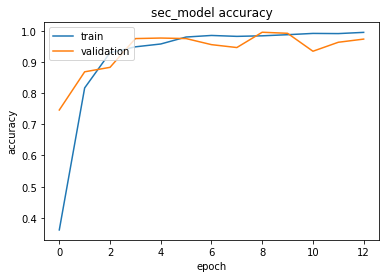

In [0]:
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('sec_model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

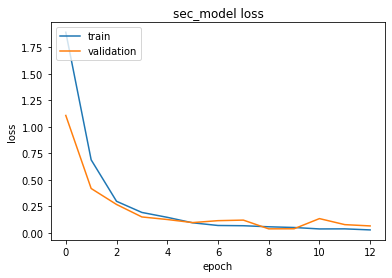

In [0]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('sec_model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [0]:
def sec_model_predict(img):
    # obtain predicted vector
    predicted_vector = sec_model.predict(img)
    # return fruit class that is predicted by the model
    return x1[np.argmax(predicted_vector)]

In [0]:
TestData_dir = 'drive/My Drive/test/TestData/'
right_pred = 0
X_real_test,test_label = read_data(TestData_dir,"RGB",(100,100))
for i,img in enumerate(X_real_test):
    pred_class_name = sec_model_predict(np.expand_dims(img, axis=0))
    true_label = test_label[i]
    pred_right = (true_label == pred_class_name)
    if pred_right:
        right_pred += 1
    f, (ax1,ax2,ax3) = plt.subplots(1,3)
    plt.subplots_adjust(bottom=0.1, right=2, top=0.9)
    ax1.imshow(img)
    ax1.set_axis_off()    
    ax1.set_title('Test Image .... True Label: '+ true_label)
    ax2.imshow(get_specific_class_img(pred_class_name))
    ax2.set_axis_off()
    ax2.set_title('Prediction: '+ pred_class_name,color=("green" if pred_right else "red"))
    ax3.imshow(get_specific_class_img(true_label))
    ax3.set_axis_off()
    ax3.set_title('True Class Sample: ')

In [0]:
print("Model after augmenting Images predicted {} images right,accuracy = {}%".format(right_pred,(right_pred*100./36)))

Model after augmenting Images predicted 13 images right,accuracy = 26.0%


In [0]:
from keras import applications
from keras.models import Sequential, Model
from keras.layers import Dense, GlobalAveragePooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
import tensorflow as tf
from keras.optimizers import SGD
from keras.utils import plot_model
from keras.callbacks import ModelCheckpoint,EarlyStopping,LearningRateScheduler

In [0]:
#import xception with pre-trained weights. do not include fully #connected layers
xception_base = applications.Xception(weights='imagenet', include_top=False)

# add a global spatial average pooling layer
x = xception_base.output
x = GlobalAveragePooling2D()(x)
# and a fully connected output/classification layer
predictions = Dense(10, activation='softmax')(x)
# create the full network so we can train on it
xception_transfer = Model(inputs=xception_base.input, outputs=predictions)



83689472/83683744 [==============================] - 1s 0us/step


In [0]:
xception_transfer.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [0]:
checkpointer = ModelCheckpoint(filepath='drive/My Drive/test/saved_models/weights.best.xception_pretrained.hdf5', 
                               verbose=1, save_best_only=True)
#Early stopping
early_stopping = EarlyStopping(monitor='val_loss', verbose=1, patience=4)

with tf.device("/device:GPU:0"): #running code using gpu
    history_pretrained = xception_transfer.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=50,
    callbacks=[checkpointer,early_stopping],
    verbose = 1,
    validation_data = validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size)



Epoch 1/50


In [0]:
xception_transfer.load_weights("drive/My Drive/test/saved_models/weights.best.xception_pretrained.hdf5")

In [0]:
xception_transfer.evaluate_generator(test_generator, test_generator.samples)

In [0]:
def tf_model_predict(img):
    # obtain predicted vector
        predicted_vector = xception_transfer.predict(img)
    # return fruit class that is predicted by the model
        return x1[np.argmax(predicted_vector)]


In [0]:
TestData_dir = 'drive/My Drive/test/TestData/'
right_pred = 0
X_real_test,test_label = read_data(TestData_dir,"RGB",(100,100))
for i,img in enumerate(X_real_test):
    pred_class_name = tf_model_predict(np.expand_dims(img, axis=0))
    true_label = test_label[i]
    pred_right = (true_label == pred_class_name)
    if pred_right:
        right_pred += 1
    f, (ax1,ax2,ax3) = plt.subplots(1,3)
    plt.subplots_adjust(bottom=0.1, right=2, top=0.9)
    ax1.imshow(img)
    ax1.set_axis_off()    
    ax1.set_title('Test Image .... True Label: '+ true_label)
    ax2.imshow(get_specific_class_img(pred_class_name))
    ax2.set_axis_off()
    ax2.set_title('Prediction: '+ pred_class_name,color=("green" if pred_right else "red"))
    ax3.imshow(get_specific_class_img(true_label))
    ax3.set_axis_off()
    ax3.set_title('True Class Sample: ')

In [0]:
print("Model predicted {} images right,accuracy = {}%".format(right_pred,(right_pred*100./36)))